# Installation Section

In [1]:
# Checks for GPU and lists them.
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [2]:
# Clone the tensorflow models repository from GitHub
#!pip uninstall Cython -y # Temporary fix for "No module named 'object_detection'" error
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4307, done.
remote: Counting objects: 100% (4307/4307), done.
remote: Compressing objects: 100% (3325/3325), done.
remote: Total 4307 (delta 1207), reused 2120 (delta 909), pack-reused 0 (from 0)
Receiving objects: 100% (4307/4307), 53.17 MiB | 26.47 MiB/s, done.
Resolving deltas: 100% (1207/1207), done.


In [3]:
# Copy setup files into models/research folder.
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .

In [4]:
# Modify setup.py file to install the tf-models-official repository targeted at TF v2.17.0
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.15.0', s)
    f.write(s)

In [2]:
#this cell may ask for a session restart. Make sure that the cell completes execution before you restart r=the session.

# Need to do a temporary fix with PyYAML because Colab isn't able to install PyYAML v5.4.1
!pip install pyyaml==5.3.1
!pip install /content/models/research/


# Need to downgrade to TF v2.12.0 due to Colab compatibility bug.
#!pip install tensorflow==2.15.0

  Using cached PyYAML-5.3.1.tar.gz (269 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Processing ./models/research
  Preparing metadata (setup.py) ... done
  Created wheel for object_detection: filename=object_detection-0.1-py3-none-any.whl size=1697318 sha256=e48b47c5edda70b200350beae2800c15a408fc94dc7cc5f78ec0ff35a9800fd2
  Stored in directory: /tmp/pip-ephem-wheel-cache-61uqdsre/wheels/95/4a/63/b2d36ca06eab841de19a38993ffaf2beac152a44539bc642a6
Successfully built object_detection
  Attempting uninstall: object_detection
    Found existing installat

In [1]:
#!pip install tensorflow_io==0.32.0  # Update TensorFlow I/O version to match TF 2.12.0
!pip install tensorflow-io-nightly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 16.1 MB/s eta 0:00:00


In [3]:
# Uninstall existing TensorFlow
!pip uninstall -y tensorflow tensorflow-estimator tensorboard

# Install NVIDIA CUDA Toolkit 11.8 (needed for TensorFlow 2.15.0)
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/cuda-ubuntu2204.pin
!sudo mv cuda-ubuntu2204.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget https://developer.download.nvidia.com/compute/cuda/11.8.0/local_installers/cuda-repo-ubuntu2204-11-8-local_11.8.0-520.61.05-1_amd64.deb
!sudo dpkg -i cuda-repo-ubuntu2204-11-8-local_11.8.0-520.61.05-1_amd64.deb
!sudo cp /var/cuda-repo-ubuntu2204-11-8-local/cuda-*-keyring.gpg /usr/share/keyrings/
!sudo apt-get update
!sudo apt-get install -y cuda-toolkit-11-8

# Install cuDNN 8.6 (needed for TensorFlow 2.15.0)
!wget https://developer.download.nvidia.com/compute/redist/cudnn/v8.6.0/local_installers/cudnn-linux-x86_64-8.6.0.163_cuda11-archive.tar.xz
!tar -xvf cudnn-linux-x86_64-8.6.0.163_cuda11-archive.tar.xz
!sudo cp -r cudnn-linux-x86_64-8.6.0.163_cuda11-archive/include/* /usr/local/cuda/include/
!sudo cp -r cudnn-linux-x86_64-8.6.0.163_cuda11-archive/lib/* /usr/local/cuda/lib64/
!sudo chmod a+r /usr/local/cuda/include/cudnn*.h /usr/local/cuda/lib64/libcudnn*

# Set Environment Variables
import os
os.environ['CUDA_HOME'] = '/usr/local/cuda-11.8'
os.environ['PATH'] += ':/usr/local/cuda-11.8/bin'
os.environ['LD_LIBRARY_PATH'] = '/usr/local/cuda-11.8/lib64:' + os.environ.get('LD_LIBRARY_PATH', '')

# Install TensorFlow 2.15.0 (GPU Version)
!pip install tensorflow[and-cuda]==2.15.0 --extra-index-url https://pypi.nvidia.com

# Verify GPU Availability
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))
print(tf.config.list_physical_devices('GPU'))


Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0
Found existing installation: tensorflow-estimator 2.15.0
Uninstalling tensorflow-estimator-2.15.0:
  Successfully uninstalled tensorflow-estimator-2.15.0
Found existing installation: tensorboard 2.15.2
Uninstalling tensorboard-2.15.2:
  Successfully uninstalled tensorboard-2.15.2
--2025-02-25 05:34:15--  https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/cuda-ubuntu2204.pin
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 23.46.228.167, 23.46.228.176, 23.46.228.170
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|23.46.228.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 190 [application/octet-stream]
Saving to: ‘cuda-ubuntu2204.pin’

cuda-ubuntu2204.pin 100%[===================>]     190  --.-KB/s    in 0s      

2025-02-25 05:34:15 (117 MB/s) - ‘cuda-ubuntu2

In [4]:
!nvidia-smi
!nvcc --version

Tue Feb 25 05:43:26 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
#this cell may ask for a session restart. Make sure that the cell completes execution before you restart the session.
!pip uninstall -y protobuf
!pip install protobuf==3.20.3
%env PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python

Found existing installation: protobuf 4.25.6
Uninstalling protobuf-4.25.6:
  Successfully uninstalled protobuf-4.25.6
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 5.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.62.3 requires protobuf>=4.21.6, but you have protobuf 3.20.3 which is incompatible.
tensorflow-metadata 1.16.1 requires protobuf<6.0.0dev,>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.
dopamine-rl 4.1.2 requires tf-keras>=2.18.0, but you have tf-keras 2.15.1 which is incompatible.


env: PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python


#### Test installation

In [1]:
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2025-02-25 05:45:12.314537: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-25 05:45:12.314597: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-25 05:45:12.316205: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-25 05:45:12.324881: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-25 05:45:13.785939: W tensorflow/compiler/tf2

In [2]:
# This cell is just for checking the TF version & GPU.
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("GPUs available:", len(tf.config.list_physical_devices('GPU')))

TensorFlow version: 2.15.0
GPUs available: 1


# Dataset collecting Section

In [ ]:
##### Skip this cell and manually upload image folder or jump to next one.

#drive_link = "< drive folder link >"


#def create_folder_download_link(drive_link):
    # Extract the folder ID from the provided Google Drive link
 #   folder_id = drive_link.split('/folders/')[1].split('?')[0]

    # Construct the download link using the extracted folder ID
#    download_link = f"https://drive.google.com/drive/folders/{folder_id}?usp=sharing"

 #   return download_link

#download_link = create_folder_download_link(drive_link)
#print(f"Download link: {download_link}")

# Download the content
#!wget -O /content/images.zip download_link

In [3]:
# This one is readymade custom dataset of united States coin images
!wget -O /content/images.zip https://www.dropbox.com/s/gk57ec3v8dfuwcp/CoinPics_11NOV22.zip?dl=0

--2025-02-25 05:49:20--  https://www.dropbox.com/s/gk57ec3v8dfuwcp/CoinPics_11NOV22.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/rcwv8vwcmjc17lfog2kkx/CoinPics_11NOV22.zip?rlkey=5x6qnygrjhwoodqv9ruid5syo&dl=0 [following]
--2025-02-25 05:49:20--  https://www.dropbox.com/scl/fi/rcwv8vwcmjc17lfog2kkx/CoinPics_11NOV22.zip?rlkey=5x6qnygrjhwoodqv9ruid5syo&dl=0
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucedce663a2812332c0d737b4578.dl.dropboxusercontent.com/cd/0/inline/CkyqlshJS6DQll1DgqYwEhAPbImJ413WPhHcajX4oEUc8ESBrLoJAUZNWXgBCmpvf2UDAreuEM2j-bqoKCotHCEtfIRXccEO97VjKDjAd0bahe4oeDnnOGa5RflYXteK27ZhdP_HTyxNsIUVFn-FGPW2/file# [following]
--2025-02-25 05:49:20--  https://ucedce663a2812332c0d737b4578.

In [4]:
!mkdir /content/images
!unzip -q images.zip -d /content/images/all
!mkdir /content/images/train; mkdir /content/images/validation; mkdir /content/images/test

In [9]:
!wget https://raw.githubusercontent.com/superguine/ODProject/main/split.py
!python split.py

Total images: 750
Images moving to train: 600
Images moving to validation: 75
Images moving to test: 75


In [10]:
# Download data conversion scripts
! wget https://raw.githubusercontent.com/superguine/ODProject/main/csv_convert.py
! wget https://raw.githubusercontent.com/superguine/ODProject/main/tfrecord.py

--2025-02-25 05:53:46--  https://raw.githubusercontent.com/superguine/ODProject/main/csv_convert.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1394 (1.4K) [text/plain]
Saving to: ‘csv_convert.py’

csv_convert.py      100%[===================>]   1.36K  --.-KB/s    in 0s      

2025-02-25 05:53:46 (28.7 MB/s) - ‘csv_convert.py’ saved [1394/1394]

--2025-02-25 05:53:46--  https://raw.githubusercontent.com/superguine/ODProject/main/tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4463 (4.4K) [text/plain]
Saving to: ‘t

In [11]:
### This creates a a "labelmap.txt" file with a list of classes the object detection model will detect.
%%bash
cat <<EOF >> /content/labelmap.txt
penny
nickel
dime
quarter
EOF

In [12]:
# Create CSV data files and TFRecord files
!python3 csv_convert.py
!python3 tfrecord.py --csv_input=images/train_labels.csv --labelmap=labelmap.txt --image_dir=images/train --output_path=train.tfrecord
!python3 tfrecord.py --csv_input=images/validation_labels.csv --labelmap=labelmap.txt --image_dir=images/validation --output_path=val.tfrecord

Successfully converted xml to csv.
Successfully converted xml to csv.
2025-02-25 05:54:31.192383: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-25 05:54:31.192439: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-25 05:54:31.193854: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-25 05:54:32.462145: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Successfully created the TFRecords: /content/train.tfrecord
2025-02-25 05:54:37.048979: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register 

In [13]:
# Store the locations of the TFRecord and labelmap files as variables
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/val.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

# Training Section

#### Configuring for training

In [14]:
# Change the chosen_model variable to deploy different models available in the TF2 object detection zoo
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

Download the pretrained model file and configuration file.

In [15]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2025-02-25 05:55:40--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.99.207, 142.250.107.207, 142.251.188.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.99.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  --.-KB/s    in 0.1s    

2025-02-25 05:55:41 (159 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2025-02-25 05:55:41--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.

In [16]:
# Set training parameters for the model
num_steps = 4000

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 16

In [17]:
# Set file locations and get number of classes for config file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    import tensorflow as tf  # Import TensorFlow explicitly

    with tf.io.gfile.GFile(pbtxt_fname, 'r') as fid:  # Use tf.io.gfile.GFile
        label_map_string = fid.read()

    from object_detection.protos import string_int_label_map_pb2
    from google.protobuf import text_format

    label_map = string_int_label_map_pb2.StringIntLabelMap()
    text_format.Merge(label_map_string, label_map)

    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True
    )
    category_index = label_map_util.create_category_index(categories)

    return len(category_index.keys())

# Call the function
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 4


In [18]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      #s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)


/content/models/mymodel
writing custom configuration file


In [19]:
# (Optional) Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

In [20]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

In [21]:
#launching Tensorboard session
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

  > **NOTE:**  It won't show anything yet, because we haven't started training. Once training starts, come back and click the refresh button to see the model's overall loss.

In [ ]:
'''
Modify /usr/local/lib/python3.11/dist-packages/tf_slim/data/tfexample_decoder.py:

Find this line:

from tensorflow.python.ops import control_flow_ops

Replace it with:

import tensorflow as tf

Then, modify the affected line where control_flow_ops.case is used:

image = control_flow_ops.case(pred_fn_pairs, default=check_jpeg, exclusive=True)

Change it to:

image = tf.case(pred_fn_pairs, default=check_jpeg, exclusive=True)

------------------------------------------
The error occurs at:

File "/usr/local/lib/python3.11/dist-packages/tf_slim/data/tfexample_decoder.py", line 453, in _decode
image = tf.case(

Modify the function in /usr/local/lib/python3.11/dist-packages/tf_slim/data/tfexample_decoder.py.
Find:

image = tf.case(pred_fn_pairs, default=check_jpeg, exclusive=True)

Replace it with:

image = tf.switch_case(
    branch_index=tf.constant(0),
    branch_fns={0: lambda: check_jpeg()}
)
-----------------------------------------------------
And if there are any control_flow_ops.cond statements, replace them with:

tf.cond

'''

In [ ]:
import os

# Define the file path
file_path = "/usr/local/lib/python3.11/dist-packages/tf_slim/data/tfexample_decoder.py"

# Check if the file exists
if not os.path.exists(file_path):
    print(f"Error: {file_path} not found.")
else:
    # Read the file contents
    with open(file_path, "r") as f:
        content = f.read()

    # Apply fixes
    content = content.replace(
        "from tensorflow.python.ops import control_flow_ops", "import tensorflow as tf"
    )
    content = content.replace("control_flow_ops.case", "tf.case")
    content = content.replace(
        "tf.case(pred_fn_pairs, default=check_jpeg, exclusive=True)",
        "tf.switch_case(branch_index=tf.constant(0), branch_fns={0: lambda: check_jpeg()})"
    )
    content = content.replace("control_flow_ops.cond", "tf.cond")

    # Write the modified content back to the file
    with open(file_path, "w") as f:
        f.write(content)

    print("✅ Modifications applied successfully.")


#### Start training

In [27]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

2025-02-25 06:12:25.230866: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-25 06:12:25.230915: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-25 06:12:25.232383: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-25 06:12:26.389070: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.11/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.11/dist-packages

# Model exportation, testing & download Section

#### Export model

In [28]:
# Make a directory to store the trained TensorFlow model
!mkdir /content/custom_model
output_directory = '/content/custom_model'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/training'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --pipeline_config_path {pipeline_file} \
    --output_directory {output_directory}


2025-02-25 06:46:18.498545: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-25 06:46:18.498596: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-25 06:46:18.500890: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-25 06:46:19.836675: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.11/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.11/dist-packages

####Inference test images

In [29]:
# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TensorFlow model and displaying results

def tf_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

    # Grab filenames of all images in test folder
    images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

    # Load the label map into memory
    with open(lblpath, 'r') as f:
        labels = [line.strip() for line in f.readlines()]

    # Load the TensorFlow model
    model = tf.saved_model.load(modelpath)
    infer = model.signatures['serving_default']

    # Randomly select test images
    images_to_test = random.sample(images, num_test_images)

    # Loop over every image and perform detection
    for image_path in images_to_test:

        # Load image and resize to expected shape [1xHxWx3]
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        imH, imW, _ = image.shape
        input_tensor = tf.convert_to_tensor(image_rgb)
        input_tensor = input_tensor[tf.newaxis, ...]

        # Perform the actual detection by running the model with the image as input
        detections = infer(input_tensor)

        # Retrieve detection results
        boxes = detections['detection_boxes'][0].numpy() # Bounding box coordinates of detected objects
        classes = detections['detection_classes'][0].numpy().astype(np.int32) # Class index of detected objects
        scores = detections['detection_scores'][0].numpy() # Confidence of detected objects

        detection_results = []

        # Loop over all detections and draw detection box if confidence is above minimum threshold
        for i in range(len(scores)):
            if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

                # Get bounding box coordinates and draw box
                # Coordinates are normalized, so we multiply them by the image dimensions to get pixel values
                ymin = int(max(1, (boxes[i][0] * imH)))
                xmin = int(max(1, (boxes[i][1] * imW)))
                ymax = int(min(imH, (boxes[i][2] * imH)))
                xmax = int(min(imW, (boxes[i][3] * imW)))

                cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)

                # Draw label
                object_name = labels[classes[i] - 1] # Adjust for zero-indexing in labels
                label = '%s: %d%%' % (object_name, int(scores[i] * 100)) # Example: 'person: 72%'
                labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
                label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
                cv2.rectangle(image, (xmin, label_ymin - labelSize[1] - 10),
                              (xmin + labelSize[0], label_ymin + baseLine - 10),
                              (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
                cv2.putText(image, label, (xmin, label_ymin - 7),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

                detection_results.append([object_name, scores[i], xmin, ymin, xmax, ymax])

        # Display or save the image with detections
        if not txt_only: # "text_only" controls whether we want to display the image results or just save them in .txt files
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(12, 16))
            plt.imshow(image)
            plt.show()

        # Save detection results in .txt files (for calculating mAP)
        else:
            # Get filenames and paths
            image_fn = os.path.basename(image_path)
            base_fn, ext = os.path.splitext(image_fn)
            txt_result_fn = base_fn + '.txt'
            txt_savepath = os.path.join(savepath, txt_result_fn)

            # Write results to text file
            # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
            with open(txt_savepath, 'w') as f:
                for detection in detection_results:
                    f.write('%s %.4f %d %d %d %d\n' %
                            (detection[0], detection[1], detection[2],
                             detection[3], detection[4], detection[5]))

    return


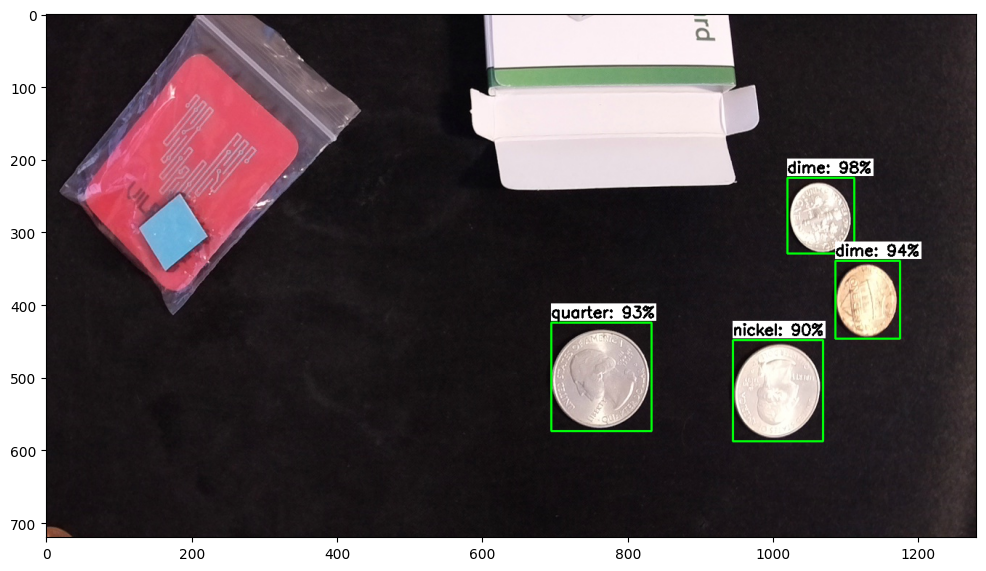

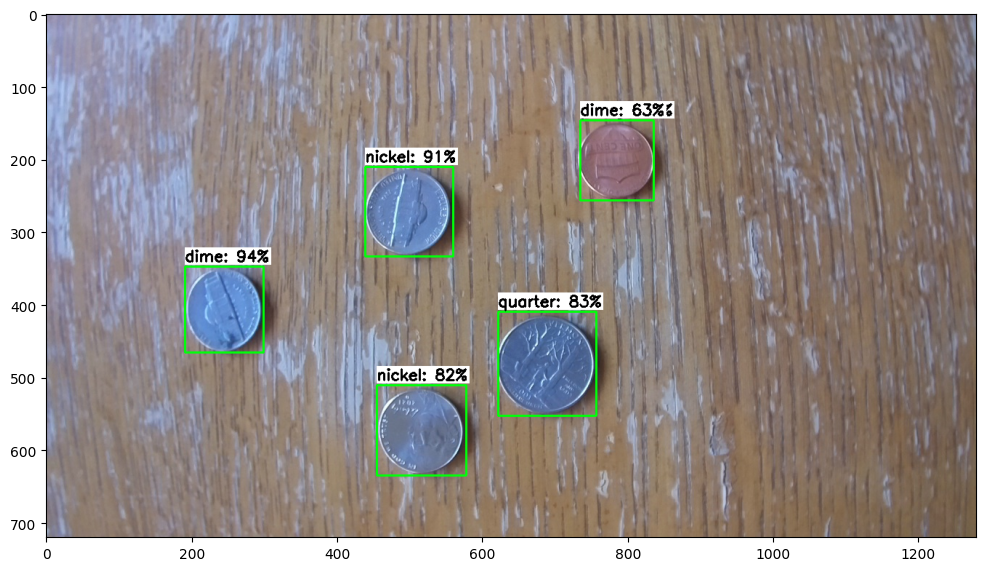

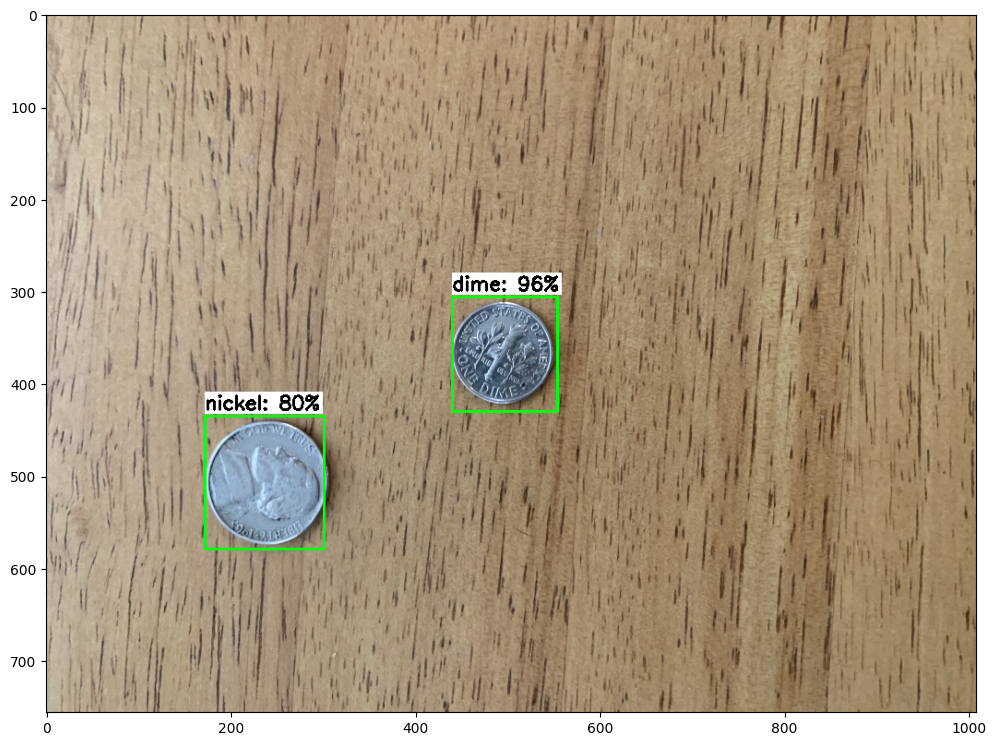

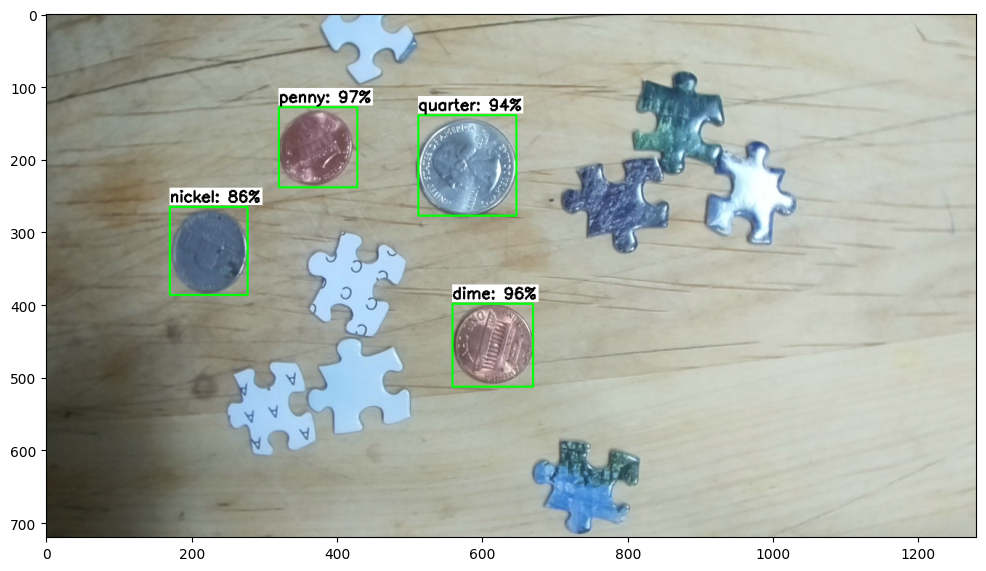

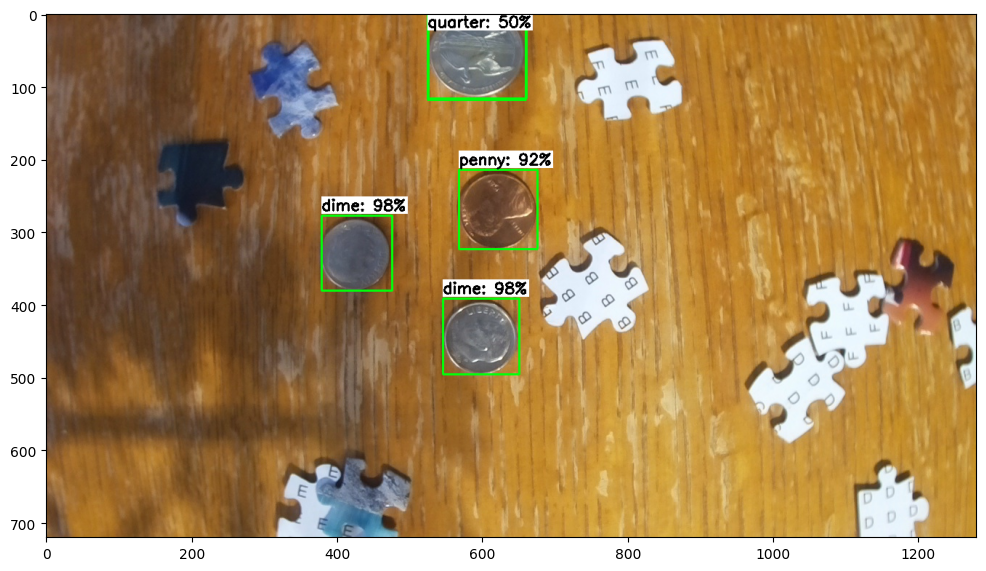

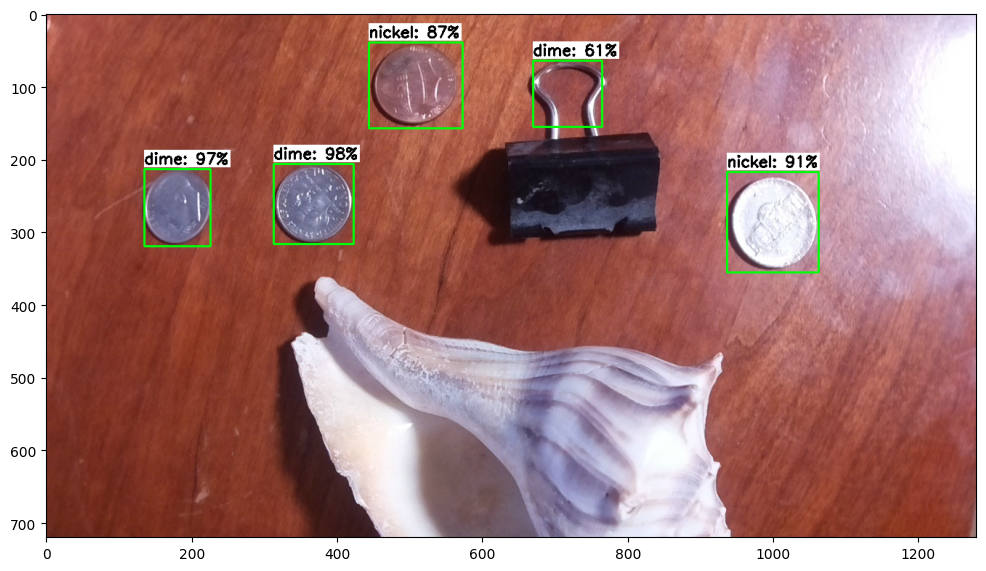

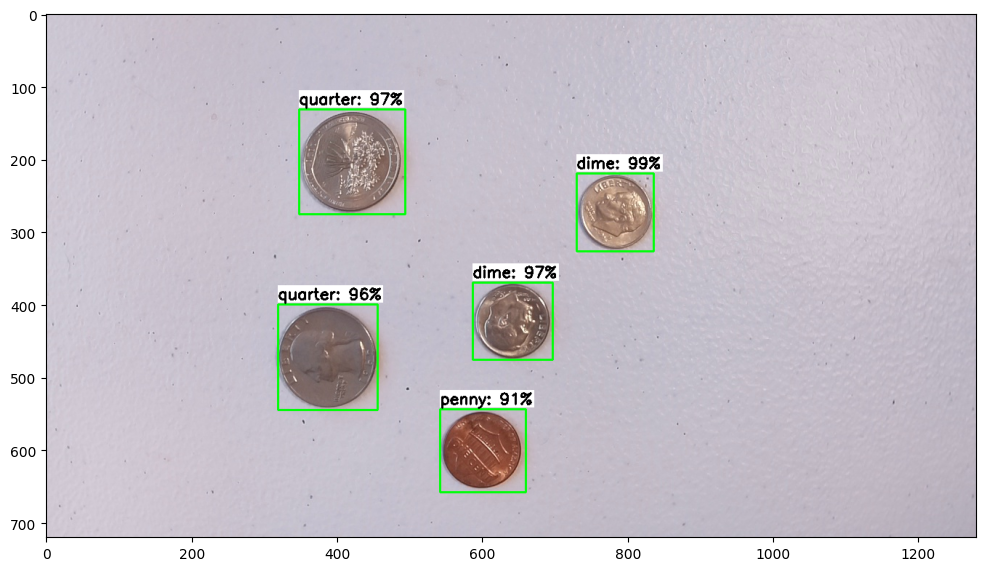

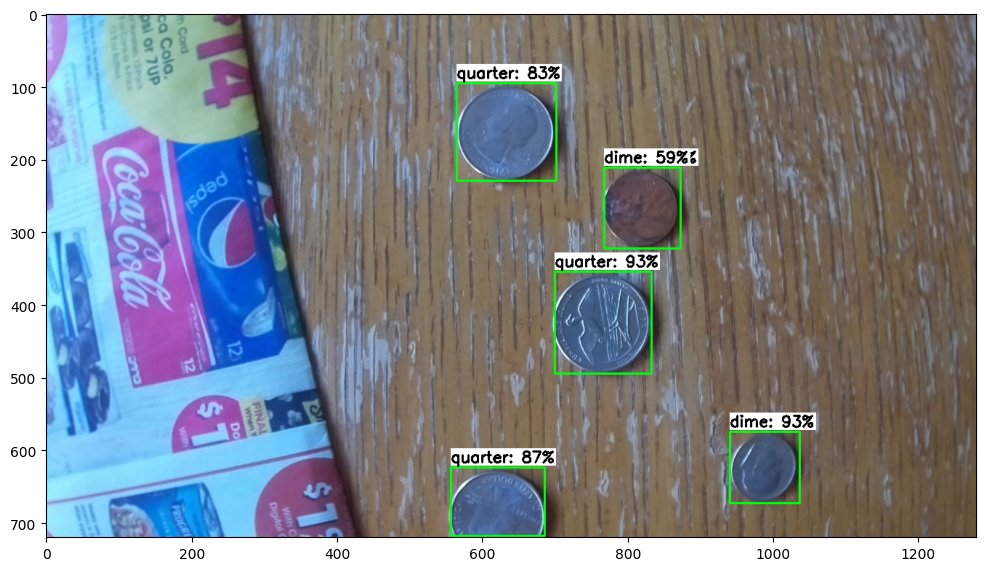

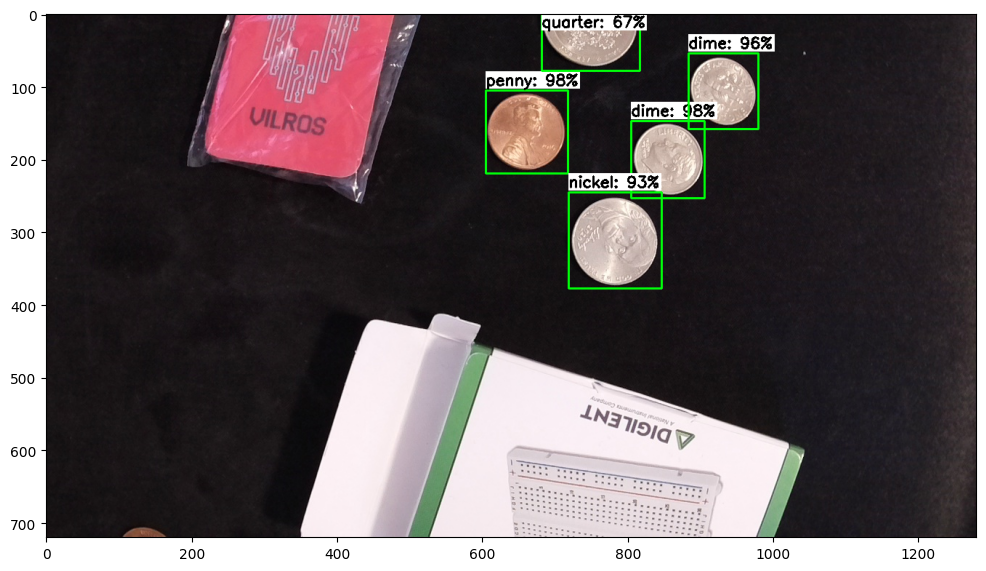

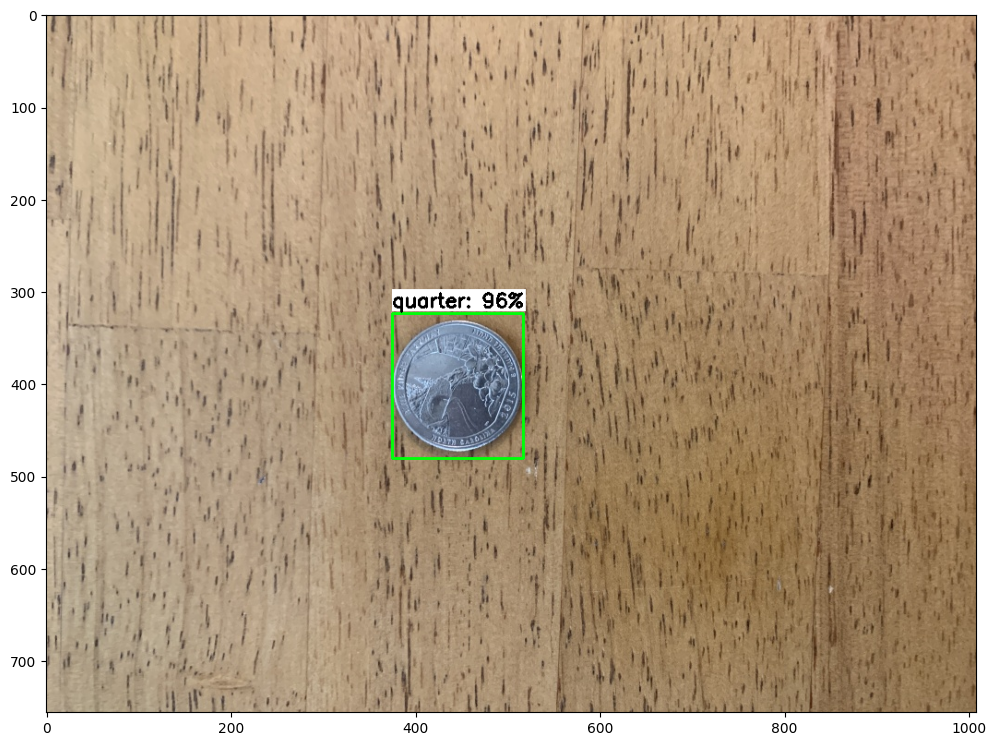

In [32]:
# Set up variables for running user's model
PATH_TO_IMAGES = '/content/images/test'   # Path to test images folder
PATH_TO_MODEL = '/content/custom_model/saved_model'   # Path to the SavedModel directory
PATH_TO_LABELS = '/content/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold = 0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on

# Run inferencing function!
tf_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)


#### Calculate mAP

In [39]:
pwd

SyntaxError: invalid syntax (<ipython-input-39-fa8a0109f51b>, line 2)

In [33]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

[Errno 2] No such file or directory: '/content/mAP'
/content/models/mymodel
python3: can't open file '/content/models/mymodel/calculate_map_cartucho.py': [Errno 2] No such file or directory


#### Download the model

In [ ]:
# Move labelmap and pipeline config files into TFLite model folder and zip it up
!cp /content/labelmap.txt /content/custom_model
!cp /content/labelmap.pbtxt /content/custom_model
!cp /content/models/mymodel/pipeline_file.config /content/custom_model

%cd /content
!zip -r custom_model.zip custom_model

In [ ]:
from google.colab import files

files.download('/content/custom_model.zip')